# 3View data workflow

This notebook describes the workflow for using IMOD to extract subvolumes from 3View data stacks saved as .mrc files, converting these subvolumes to .npz files for upload and segmentation in [Caliban](http://www.github.com/vanvalenlab/Caliban). The purpose of acquiring 3View data and uploading to Caliban is to create a training data set for deep learning-enabled  single cell image segmentation with [DeepCell](http://deepcell.org/) ([Moen et al., 2019](https://doi.org/10.1038/s41592-019-0403-1); [Van Valen et al., 2016](https://journals.plos.org/ploscompbiol/article?id=10.1371/journal.pcbi.1005177)). Both Caliban and DeepCell are open source software packages for the scientific community developed by the [Van Valen Lab](http://www.vanvalen.caltech.edu/) at Caltech. 


The following sections are covered:

1. Introduction to 3 View data<br>
    1.1 what is 3View?<br>
    1.2 extracting information from .mcr header<br>
2. Software installations<br>
    2.1 IMOD<br>
       2.1.1 Intro to IMOD<br>
       2.1.2 Download IMOD<br>
       2.1.3 Install IMOD<br>
    2.2 Docker<br>
       2.2.1 Intro to Docker<br>
       2.2.2. Install Docker<br>
    2.3 Caliban<br>
       2.3.1 Intro to Caliban<br>
       2.3.2 Install Caliban<br>
3. Extracting subvolumes on IMOD<br>
    3.1 Opening an .mcr file in IMOD<br>
    3.2 Defining the subvolume<br>
    3.3 extracting the subvolume using trimvol<br>
4. Conversion to .npz <br>
    4.1 opening an .mcr file in python<br>
    4.2 viewing data in python (TBD)<br>
    4.3 refining ROIs<br>
    4.4 conversion to .npz<br>
5. Opening an .npz file in Caliban<br>

---

## Set up

This notebook assumes that you have working knowledge of the command line and basic [Unix](https://opensource.com/article/18/5/differences-between-linux-and-unix). If this doesn't sound familiar or you need a refresher, I recommend the [Unix crash course](https://astrobiomike.github.io/unix/unix-intro) at [Happy Belly Bioinformatics](https://astrobiomike.github.io/).<br>

This work flow also assumes basic knowledge of [python](https://www.python.org/) and the [Jupyter](https://jupyter.org/) ecosystem including the use of [Jupyter Lab](https://jupyterlab.readthedocs.io/en/stable/) and [Jupyter Notebook](https://jupyter-notebook.readthedocs.io/en/stable/).<br>

If this all sounds familiar and you have Jupyter lab installed on your computer and you're comfortable running a Jupyter Notebook, then skip down to creating and activating a python environment and then open the .ipynb version of this file, which is actually an [SoS notebook](https://vatlab.github.io/sos-docs/) ([Peng et al., 2018](https://doi.org/10.1093/bioinformatics/bty405)), allowing for different language kernels to be run in individual cells. There is a nice [summary of SoS](https://vatlab.github.io/blog/post/sos-notebook/) on the developing lab, vatlab, [blog](https://vatlab.github.io/blog/).  If you're still convinced I'm spelling the name of the largest planet in our Solar System wrong, then check out the recommended resources below:

## Getting set up with Anaconda, Jupyter, and Python

First, some quick definitions: **python** **conda** **Anaconda** **Jupyter**

I highly recommend going over to Justin Bois' bebi103 [content page](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/index.html) and completing at least [lesson 0a and b](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_00/index.html). If you successfully complete lesson 0, you should end up with a working Anaconda distribution, the conda package manager, a working python environment for running this pipeline and a bare bones knowledge of python. I also highly recommend lessons 1-5 and then downloading those notebooks and keeping them in a handy reference directory. [Lesson 5](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_05/index.html), an Introduction to Image Processing, and the corresponding lecture, [Intro to images](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lecture_notes/lecture_05/index.html) both provide excellent background on the data structure and manipulation of images as simple arrays of numbers.<br>

When following along to [Lesson 0](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_00/l00a_python_for_scientific_computing.html), follow the instructions until you get to the [Installations](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_00/l00a_python_for_scientific_computing.html#Installations) section. Instead of individually installing each package, I have created a conda environment that contains all of the required packages. When you get to the Installations step, go down to **Creating a conda environment** below and then pick up the BeBi tutorial at [Checking your distribution](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_00/l00a_python_for_scientific_computing.html#Checking-your-distribution) before continuing on to [Lesson 0b](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_00/l00b_intro_to_jupyterlab.html): Introduction to Jupyter Lab.<br>

## Creating a conda environment

[Conda](https://docs.conda.io/projects/conda/en/latest/index.html) is an open-source, language agnostic, package management system. It allows you to create individual software environments that contain the packages required for your code to run. This allows, for example, two different program that may have conflicting dependencies to each run in their own environment. It also provides an easy way to share specific environments to facilitate data reproducibility and code sharing. There is extensive documentation including a [managing environments](https://docs.conda.io/projects/conda/en/latest/user-guide/tasks/manage-environments.html) section, I recommend downloading the [cheat sheet](https://docs.conda.io/projects/conda/en/latest/_downloads/843d9e0198f2a193a3484886fa28163c/conda-cheatsheet.pdf) for quick reference.

To create a working environment for image processing, you must know the location of the `image_seg_env.yml` file located in image_segmentation/SOPs/files_for_SOP/image_seg_env.yml. In the terminal navigate to the directory containing the `.yml` file and then execute the following:

    conda env create -f image_seg_env.yml
    
Now activate the environment by executing the following in the terminal. You should activate this environment before starting Jupyter labs or running any of the scripts in this notebook. 

    conda activate image_seg_env
    
To see a list of packages installed in this environment execute the following:

    conda env list
    
It's a good idea to save a list of the current package versions that you used after analyzing data with a script dependent on the current package dependencies installed. This helps troubleshoot when something stops working, but also facilitates reproducibility. To save a text file with the current package information after you are finished processing, navigate to the directory where you want the file to be saved and execute the following replacing \<projectname\> and \<date\>:

    conda list --explicit > <projectname>_<date>_env.txt
    
**In summary, when you want to work on this project:**<br>
    1. open terminal<br>
    2. navigate to the project working directory<br>
    3. execute `conda activate image_seg_env`<br>
    4. execute `Jupyter Lab`<br>
    5. to close the Jupyter notebook, type `control-C` in the terminal window and then close the browser window

## Downloading data from the NCMIR server

3View data is collected at the National Center for Microscopy and Imaging Research ([NCMIR](https://ncmir.ucsd.edu/)) at USCD. Data is stored on the Center for Research in Biological Systems ([CRBS](http://crbs.ucsd.edu/)) database. You will need a personal CRBS account set up to ssh into the CRBS database through one of three servers to access NCMIR data products. If you only need short term or single use access you can ask Haley for her account details. <br>

Open two terminal windows. One will be used to ssh into CRBS so that you can explore the directory structure and copy the path to the data file you want to download. Paths for general Orphan lab XRM and 3View data are below. If you already know the path, you only need to open one terminal window. The second terminal window will be used to download the data file to a local drive using the `scp` ([secure copy](https://www.geeksforgeeks.org/scp-command-in-linux-with-examples/)) command. <br>

To access data (know your project number, core XRM is #20349, know your scan number microscopy_######)
Work from the processed data folder. Contains links to the raw data. The raw data folder cannot be written to. <br>

**XRM data:**<br>
Home > CCDV_DATA_USER.portal > CCDB_DATA_USER > acquisition > project20349 > microscopy_5381173 > processed data > ‘scan folder’ > ‘LE2 folder’ > ‘TIFFS folder’
Select all tiffs to read into AMIRA

**3View data:**<br>
/ccdbprod/ccdbprod19/home/CCDB_DATA_USER.portal/CCDB_DATA_USER/acquisition/project_20349/microscopy_5381460/processed_data/CCDBID_5381460_11-10073_SBEM2/alignedStack/

>The .mrc files are the 3View stack data files at various binning levels. The unbinned data (and even the bin 4 data) files are very large. Make sure you have a stable internet connection and enough hard drive space. I recommend copying to an external hard drive. To test commands or learn how to work through this workflow, I recommend downloading the bin10 data. <br>

1. **explore CRBS to identify file path**<br>
    i. in the terminal ssh into CRBS, entering your password at the prompt<br>
    `ssh username@death.crbs.ucsd.edu`<br>
    The death server may be busy or down. If this does not connect, try jane or famine.<br>
    
    ii. navigate to the project directory. For 3View data execute the following:<br>
    `cd /ccdbprod/ccdbprod19/home/CCDB_DATA_USER.portal/CCDB_DATA_USER/acquisition/project_20349/microscopy_5381460/processed_data/CCDBID_5381460_11-10073_SBEM2/alignedStack/`<br>
    
    iii. To see a list of all available files:<br>
    `ls -l`<br>
    
    iv. To print the current working directory:<br>
    `pwd`<br>
    
    This is the output that you will copy into the `scp` command. You will need to add the file name from `ls -l` function<br>
    
2. **copy a file on the CRBS server to a local directory**<br>
You will need the file path to the file you want to copy on the CRBS server. Open a terminal window and navigate to where you want to copy the data file. Make sure there is enough space on the desired drive. Execute the following, for example to copy the 3View bin 10 data (replacing the file path to copy a different file):

`scp <username>@death.crbs.ucsd.edu:/ccdbprod/ccdbprod19/home/CCDB_DATA_USER.portal/CCDB_DATA_USER/acquisition/project_20349/microscopy_5381460/processed_data/CCDBID_5381460_11-10073_SBEM2/alignedStack/11-10073_SBEM2_bin10.mrc ./`

Remember to replace <username> with your log in credentials. You may need to change servers by replacing `death` with `jane` or `famine`. Enter you password at the prompt.

## 1. Introduction to 3View 

### 1.1 what is 3View?

### 1.2 Extracting information from .mcr headers
In the terminal, navigate to directory containing your .mcr 3View files, then run the following command at the prompt:<br>
`header my_3view_file.mrc`<br>
The output will look like this:<br>

`RO image file on unit   1 : 11-10073_SBEM2_bin10.mrc     Size=    4527511 K`

 `Number of columns, rows, sections .....    1706    2696     504
 Map mode ..............................    1   (16-bit integer)          
 Start cols, rows, sects, grid x,y,z ...    0     0     0    1706   2696    504
 Pixel spacing (Angstroms)..............   550.0      550.0      700.0    
 Cell angles ...........................   90.000   90.000   90.000
 Fast, medium, slow axes ...............    X    Y    Z
 Origin on x,y,z .......................    385.0       495.0       0.000   
 Minimum density .......................  -17065.   
 Maximum density .......................  -1584.4   
 Mean density ..........................  -4864.1   
 tilt angles (original,current) ........   0.0   0.0   0.0   0.0   0.0   0.0
 Space group,# extra bytes,idtype,lens .        0        0        0        0`

     4 Titles :
`raw2mrc: Converted to mrc format.                       27-Aug-19  14:11:15    
NEWSTACK: Images copied             , densities scaled  27-Aug-19  15:56:52   
NEWSTACK: Images copied, transformed                    28-Aug-19  17:23:13   
NEWSTACK: Images copied                                 28-Aug-19  22:15:29`

The first line will give you the dimensions in voxels: this stack is 1706 x 2696 pixels and has 504 slices. 
The pixel spacing line will give you the voxel sizes in angstroms per voxel. This file has anisotropic voxels that are 55nm/voxel in x and y and 70nm/voxel in z. 

---

# 2. Software installation

There are three main software packages that are required. IMOD, Docker, and Caliban. Each of these is described in a dedicated section below. 

## 2.1 IMOD

From the IMOD home page:<br>

> IMOD is a set of image processing, modeling and display programs used for tomographic reconstruction and for 3D reconstruction of EM serial sections and optical sections. The package contains tools for assembling and aligning data within multiple types and sizes of image stacks, viewing 3-D data from any orientation, and modeling and display of the image files. IMOD was developed primarily by David Mastronarde, Rick Gaudette, Sue Held, Jim Kremer, Quanren Xiong, and John Heumann at the University of Colorado.<br>

>The development of IMOD has been supported by grants from the National Center for Research Resources, the National Institute of General Medical Sciences, and the National Institute for Biomedical Imaging and Bioengineering. IMOD and virtually all programs contained within the IMOD package are Copyright (c) 1994-2017 by the Regents of the University of Colorado. Other contributors are acknowledged in our [Copyright and Credits](https://bio3d.colorado.edu/imod/COPYRIGHT.txt) statement. 

The current version of IMOD as of May 4, 2020 available for Linux, Windows, and Mac OS X is **IMOD 4.9** <br>

Current release notes, hardware and operating system requirements, and links for guides, assistance and information are available at the [IMOD homepage](https://bio3d.colorado.edu/imod/) and will not be re-produced here. <br>

IMOD is a collection of programs with utilities for image manipulation. We will use IMOD to handle the unbinned 3View stacks which can be very large (>0.5TB) and extract smaller subvolumes to work with individual aggregates.  The GUI is called 3dmod. This is the program that is launched to interactively view data, models, and segmentation. There are also a number of command line programs. IMOD is well [documented](https://bio3d.colorado.edu/imod/doc/program_listing.html) and contains modules for pretty much any image processing you can think of. USCD provides an introductory [IMOD software demo](https://www.youtube.com/watch?v=PcssFElV6v0) hosted on YouTube by Alex Perez. 

Program descriptions: https://bio3d.colorado.edu/imod/doc/program_listing.html
IMOD summary wiki: https://andrewnoske.com/wiki/IMOD_-_tutorial
https://andrewnoske.com/wiki/IMOD
https://github.com/CRBS/cdeep3m/wiki/Tutorial-1-Generating-training-data-with-IMOD

**IMOD Guide**
The [IMOD Guide](https://bio3d.colorado.edu/imod/doc/guide.html) has important installation information as well as sample workflows. It may be helpful to review the Dropbox power point guide prior to installation as well. The Dropbox instructions do not cover Mac OS installation, which is covered in this document.<br>

**Citation**
Kremer J.R., Mastronarde, D.N., and McIntosh, J.R. (1996) [Computer visualization of three-dimensional image data using IMOD](http://bio3d.colorado.edu/imod/paper/). J. Struct. Biol. 116:71-76. 


**Before Downloading**

The [current release of IMOD](https://bio3d.colorado.edu/imod/download.html) is available for download. Prior to download, the IMOD team requests the following:<br>

1. [Register](https://bio3d.colorado.edu/imod/register.html) with us and help us continue work on this project. The information you give will only be used to help us continue to get funding. 
2. Join the [IMOD mailing list](https://bio3d.colorado.edu/imod/joinlist.html#Maillist) to get notifications about new releases and trainings, or the IMOD discussion list, where many questions are raised and answered. These lists also help us keep track of the interest in IMOD. 
3. Report bugs so we can fix them and give us feedback on your experiences with IMOD so future versions will contain the features you need. Send to mast@colorado.edu
4. If you publish work using IMOD, please reference us. The citation is: Kremer J.R., Mastronarde, D.N., and McIntosh, J.R. (1996) Computer visualization of three-dimensional image data using IMOD. J. Struct. Biol. 116:71-76. 

**Additional references**<br>
- Mastronarde, D.N. (1997) Dual-axis tomography: an approach with alignment methods that preserve resolution. J. Struct. Biol. 120:343-352.
- Mastronarde, D.N. and Held, S.R. (2017) Automated tilt series alignment and tomographic reconstruction in IMOD. J. Struct. Biol. 197:102-113. 


### 2.2.1 IMOD Mac installation 

Please see the [IMOD documentation page](https://bio3d.colorado.edu/imod/) for full detailed instructions. The instructions below will walk through downloading and installing IMOD on a Mac running OS X. 


**1. Download IMOD**

The latest stable IMOD release for Mac is available [here](https://bio3d.colorado.edu/imod/download.html#Latest-Mac). 

>These packages of IMOD 4.9 run only under 64-bit systems with Intel processors. If you want to use a GPU for computing tomograms, the package built with CUDA 6 should be used if you have CUDA 6 drivers; the package built with CUDA 8 should be used if you have CUDA 8 or higher drivers. This IMOD is a higher version than for other operating systems because it has a Mac-specific change. 

There are three different releases compatible with different versions of Mac OS X. This guide specifically refers to the release for Mac OS X 10.11 - 10.15:
>Mac OS X 10.11 - 10.15: Download clickable installer or command-line self-installing file of IMOD 4.9.13 for Mac OS X 10.11 - 10.15. This package was built on 10.12 compatibly with 10.11 and with CUDA version 8. It was updated on 11/19/19 to install properly for use with the zsh shell, which is now the default on OS 10.15. 

There are two different download files:
1. [clickable installer](https://bio3d.colorado.edu/imod/osx/imod_4.9.13_osx10.11_CUDA8.0.pkg) 
2. [command-line self installing file](https://bio3d.colorado.edu/imod/osx/imod_4.9.13_osx10.11_CUDA8.0.sh)
I found that the clickable installer did not work and recommend proceeding with the command-line self installing file and using the following instructions.<br>

There are specific instructions in the IMOD guide for [installing IMOD on a Mac running OS X](https://bio3d.colorado.edu/imod/doc/guide.html#InstallingMac)

**2. Install IMOD**

1. Download the command-line self installing file. If you get an error that you do not have permission to open an application from an unknown developer, run the following command in terminal. After each line you will be prompted for your computer password.
`sudo spctl --master-disable` # disable<br>
`sudo spctl --status` # check status<br>
`sudo spctl --master-enable` # re enable<br>
`sudo spctl --status` # make sure re-enabled<br>
final output should be `assessments enabled`
2. Create a directory in your applications folder called 'IMOD' and move the download file into the new IMOD directory
3. In terminal, navigate to the IMOD directory, depending on your current working directory the path should be similar to `/Applications/IMOD`
4. From the IMOD directory, run the following command. Make sure the file name is the name of the file you just downloaded and moved: <br>
`sudo sh imod_download_file_osx_intel64.sh`
5. Close and restart terminal 
6. Navigate to `/Applications/IMOD` and run the following to make the IMOD icon run the program when clicked:<br>
`sudo $IMOD_DIR/linklibs-mac -i $IMOD_DIR`
7. In finder, test the install by navigating to Applications/IMOD/bin/3dmod and clicking on the  3dmod icon. This should launch IMOD and you should be able to follow the rest of the dropbox IMOD guide<br>
![3dmod_idcon](files_for_SOP/3dmod_icon.png)

## 2.2 Docker
[Docker](https://www.docker.com/) is the industry standard for [containers](https://www.docker.com/resources/what-container) that maintain standardized, compartmentalized environments for software development. A container can be thought of as a standard unit of software that packages up code and all of its dependencies so that the applications being developed run reliably and reproducibly on different host machines that may have different infrastructures. Containerized software is isolated from the operating system environment so that it will always run uniformly regardless of infrastructure. A docker container image is a standalone executable package of software that includes everything needed to run the application: code, runtime, system tools, system libraries and settings. A container image becomes a container at runtime and in the case of Docker containers, images become containers when they are run on the [Docker Engine](https://www.docker.com/products/container-runtime). Docker provides a [self-paced tutorial](https://www.docker.com/101-tutorial) to learn how to build and share a containerized application.<br>
<br>
A container is conceptually and functionally different than a virtual machine. A virtual machine is abstraction of physical hardware that turns one server into many servers, a hypervisor, an interface between the host machine and virtual machine, allows many virtual machines to run on a single machine. Each virtual machine contains a full copy of an operating system, becoming memory intensive. A container is an abstraction at the application layer packaging code and dependencies. Multiple containers can share one operating system kernel, each running isolated processes, making them much lighter than virtual machines. 

We will run Caliban in a Docker container using the Docker engine. 

### 2.2.1 Build a Docker Container
These instructions are based on the instructions provided on the Van Valen group [GitHub Docker page](https://github.com/vanvalenlab/Caliban). 
1. **Download a VNC viewer.** If you do not already have a Virtual Network Computing (VNC) viewer, you will need to download a free VNC viewer to view the Caliban application inside the Docker Container. A VNC viewer is a graphical desktop-sharing systems that uses the remote frame buffer protocol (RFB) to remotely control another computer, in our case, it will control Caliban inside the Docker container. You can download a VNC viewer at [VNC direct](https://www.realvnc.com/en/connect/download/viewer/). 
2. **Build a Docker container containing Caliban.** Run the following code in the terminal, the current working directly will be the file location<br>

`git clone https://github.com/vanvalenlab/caliban.git
cd caliban
docker build -t caliban .`

3. **Run the Docker image.** This will launch a new Docker container and run Xvfb, Fluxbox, and a VNC server. To access the container's display, point a VNC client to 127.0.0.1. run the code below by executing the cell or copy the commands into a new terminal window. <br>

`cd caliban\
git fetch\
git checkout master\
git pull`


`docker run \
-p 5900:5900 \
-v $PWD/caliban/desktop:/usr/src/app/desktop  \
--privileged \
caliban:latest`

4. **Access the Container's display.** Start the VNC viewer application (Mac search 'VNC Viewer') and point the VNC client to 127.0.0.1.  typing in the VAN connect address bar.

5. **Access Caliban through the terminal emulator.** Start the terminal emulator by right-clicking the desktop and selecting <br>

`Applications > Terminal Emulators > XTerm`

6. **Start Caliban**<br>
    a. *From a 3Veiw obtained .npz file.* Enter the following at the terminal and Caliban will start. You need to know the location of the 3View file that you want to open in .npz format, remember to include the full path and file name and extension.<br>
`cd desktop
python3 caliban.py [input file location]`<br>

bin4_agg1.npz

    b. *Alternatively you can start Caliban from a sample .trk file.* Use this option if you have not yet excised a subvolume from a 3View stack using IMOD and converted this subvolume to an .npz file using the python converter described below. <br>   
`cd desktop
python3 caliban.py examples/trackfile1.trk`
    

## 2.3 Caliban

Caliban is a collection of data curation tools for DeepCell. The [Caliban github](https://github.com/vanvalenlab/Caliban) page contains a quick start guide as well as a guide to key binds.  We will run Caliban in a Docker Container. Caliban will open .trk or .npz files. We will be working with .npz files that contain two zipped files corresponding to raw images and annotated images. As per the Caliban readme, if the files are not named 'raw' and 'annotated' or 'X' and 'y', the first file in the.npz will be opened as the raw images. Both raw and annotated images must be in 4D arrays in the shape: frames (z slices), y, x, channels or features (segmentation labels). Caliban will be used to generate feature labels or segmentation of the 3View data into specific regions of interest such as bacterial cells, archaeal cells, poly-phosphate granules, and carbon storage granules. 

### 2.3.1 Running Caliban

Caliban will be installed with the creation of the docker container in section 2.2.1. Once you have a Docker container set up, Caliban can be started by running steps 3-6 above and summarized here:

    # get latest Caliban build 
    cd /Users/sapers/Dropbox/image_segmentation/caliban
    
    git fetch \
    git checkout master \
    git pull
    
    # if you need to kill changes 
    git reset --hard HEAD

    # run docker image
    docker run \
    -p 5900:5900 \
    -v $PWD/desktop:/usr/src/app/desktop \
    -v /Volumes/Transfer/extracted_aggregates:/usr/src/app/files \
    --privileged \
    caliban:latest

    # point VNC client to 127.0.0.1
    
    # access Caliban through terminal emulator
        right click on desktop
        Applications>Terminal Emulator>XTerm
        
    # start Caliban
    cd desktop [use/src/app/desktop - this is where you end up in the terminal emulator]
    python3 caliban.py f
    iles
    
To stop running the Docker container, In a new terminal window execute the following:<br>
   
    Docker ps (node name)
    Docker kill node_name


In [ ]:
docker run \
-p 5900:5900 \
-v $PWD/desktop:/usr/src/app/desktop \
-v /Volumes/Transfer/extracted_aggregates:/usr/src/app/files \
--privileged \
caliban:latest

## 3 Extracting subvolumes on IMOD

The full 3View stacks generated are large files ~500GB and individual aggregates need to be extracted for import into Caliban and segmentation.

Now that you have IMOD installed and working, you need to load your 3View data (.mcr) into IMOD and display the data using the Zap Window (the main image viewer used by the 3dmod GUI).

### 3.1 Opening an `.mcr` file in IMOD 

To open up a 3view stack you must have a local copy of the 3view data (or a mapped server drive). The 3view data is in an .mcr file. 

Once you open IMOD by clicking the 3dmod icon in `Applications/IMOD/bin/3dmod` you will see the following screen:

1. Enter the file path or select the .mcr file you want to view in the `Image file(s)` box.
2. leave the min and max x, y, z value blank to open the entire image
3. In the `Use cache, set to:` box, enter '1' to decrease the time it takes to open the first section. This is the number of slices that IMOD will load into active memory. By default it will try and load everything into memory and crash your laptop. <br>

![IMOD_inital_screen](files_for_SOP/IMOD_initial_screen.png)

## 3.2 Extracting the subvolume
Once open, the [ZaP window](https://bio3d.colorado.edu/imod/doc/3dmodHelp/zap.html) will display the selected slice of your 3View stack. The Zap window also contains several tools in the tool bar: Use the Z-slider to scan through Z slices or enter the number of slice to view in the box directly to the R of the Z slider. The rubber band tool will be used to select a region to excise (see the tool bar section of the [Zap Window Controls'](https://bio3d.colorado.edu/imod/doc/3dmodHelp/zap.html) information page. The [info window](https://bio3d.colorado.edu/imod/doc/3dmodHelp/infowin.html) contains information about the selected slice, point controls, and a text output box. We will use the [`trimvol` command](https://bio3d.colorado.edu/imod/doc/man/trimvol.html)to excise a region. 

1. Use the rubber band tool or press `shift-B` to select an X, Y area to extract. 
2. Use the slider to find the bottom and top slices defining the volume you want to extract. Enter the number of the bottom slice in the `lo` box and the number of the top slice in the `hi` box. 
3. Press `shift-i` to activate the `trimvol` program. You should see the trimvol command pop up in the text output window.
4. copy the `trimvol` command and execute the following in terminal from the current working directory (directory that contains the open .mrc file.) Replace the example coordinates with the coordinate in the window. Do not add file paths in the text output window and then copy into terminal. Add the file paths in terminal after copying the output.<br>
`trimvol -x 777,1192 -y 1496,1851 -z 195,255 path/to/open/data.mrc path/and/name/of/sub_data.mrc` <br>

![IMOD_zap_window](files_for_SOP/zap_window.png)

---

## 4 Conversion to .npz

Caliban uses .npz files which are arrays that hold x,y,z image data and information about segmentation labels. We will use python to open the .mcr file created from the subvolume of the 3View datastack to convert to an .npz file for upload into Caliban. The following code cells can be run directly from this notebook if copied and opened in the current working directory (location of the .mcr files)

### 4.1 opening an .mcr file in python
Now that we have smaller .mcr files corresponding to the individual aggregates, we can open these smaller files in python to convert to .npz files. We can also refine ROIs and do other image manipulation. These will not be covered in this document, but Justin Bois's [intro to image processing](http://bebi103.caltech.edu.s3-website-us-east-1.amazonaws.com/2019a/content/lessons/lesson_05/index.html) is an excellent resource. 
<br>
<br>

First we need to import all of the modules we will be using. You may get a pystan warning. You can ignore this. The first time modules are imported may take a few minutes. 

Loading BokehJS ...

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
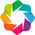

In [7]:
# import modules
import glob
import os
import path
import ntpath

import numpy as np
import pandas as pd

# Image processing tools
import mrcfile
import skimage
import skimage.io

from bokeh.palettes import Viridis, Greys
from bokeh.io import export_png

import bebi103

import bokeh
bokeh.io.output_notebook()

import panel as pn
pn.extension()

import colorcet

import holoviews as hv
hv.extension('bokeh')

<br>
Next we will set a pallet for rendering the stack in python and the open the mcr file and look at the mcr header that contains information about the extracted subvolume. This second step may take a while if you are opening a large image stack.

In [12]:
#set a palette for rendering 3View data
pal = Greys[256]

In [13]:
# look at the header of the bin4 data
mrc = mrcfile.open('/Volumes/LaCie/11-10073_SBEM2_bin10.mrc')
mrc.header

rec.array((1706, 2696, 504, 1, 0, 0, 0, 1706, 2696, 504, (938300., 1482800., 352800.), (90., 90., 90.), 1, 2, 3, -17065.03, -1584.36, -4864.125, 0, 0, b'\x00\x00\x00\x00\x00\x00\x00\x00', b'', 0, b'\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x49\x4D\x4F\x44\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00\x00', (385., 495., 0.), b'MAP ', [68, 65,  0,  0], 0., 4, [b'raw2mrc: Converted to mrc format.                       27-Aug-19  14:11:15     ', b'NEWSTACK: Images copied             , densities scaled  27-Aug-19  15:56:52     ', b'NEWSTACK: Images copied, transformed                    28-Aug-19  17:23:13     ', b'NEWSTACK: Images copied                                 28-Aug-19  22:15:29     ', b'\x00\x00\x00\x00\x00\x00\x00\x00\x01\x00\x00\x00B\x08\x00\x00\x01\x0

<br>
Next we will check the shape of the data. It should be a numpy array with x and y values for every z value

In [14]:
# get the image data and check the shape of the data
# 3D grayscale (pln, row, col).data
stack_data = mrcstack_data = mrc.data
stack_data.shape

(504, 2696, 1706)

In [15]:
type(stack_data)

numpy.ndarray

In [16]:
dt = np.dtype('>i4')   
print("Byte order is:",dt.byteorder)  
print("Size is:",dt.itemsize) 
print("Data type is:",dt.name) 

Byte order is: >
Size is: 4
Data type is: int32


In [ ]:
#rescale or not... this isn't working... 
test = skimage.exposure.rescale_intensity(stack_data, in_range='image', out_range=np.int16)
test = test.astype(np.int16)

/Users/sapers/anaconda3/envs/bebi103/lib/python3.7/site-packages/skimage/exposure/exposure.py:351: RuntimeWarning: overflow encountered in short_scalars
  image = (image - imin) / float(imax - imin)


<br>
We can extract the voxel size information from the header

In [17]:
mrc.voxel_size

rec.array((550., 550., 700.),
          dtype=[('x', '<f4'), ('y', '<f4'), ('z', '<f4')])

**optional** To view and interactive stack in this notebook (it often takes the full data volume a frustratingly long time to load each frame) 

In [18]:
#create a list of 2D x,y values for each slice
images = []
for n in range (0,(len(stack_data)-1)):
    slice = stack_data[n]
    images.append(slice)

In [19]:
ic = skimage.io.collection.MultiImage(images, conserve_memory=True)
print('There are {0:d} images in the stack.'.format(len(ic)))
print(type(ic))

There are 503 images in the stack.
<class 'skimage.io.collection.MultiImage'>


In [20]:
# remeber that array[1] is short for array[1, :, :] or all row and col of slice 1
pal = Greys[256]

def display_image(slice):
    return bebi103.image.imshow(stack_data[slice], interpixel_distance=(mrc.voxel_size['x']/1000), length_units="um", cmap=pal,
                               colorbar=False, frame_height = 700)

pn.interact(display_image, slice=(0, len(stack_data)-1))

Column
    [0] Column
        [0] IntSlider(end=503, name='slice', value=251)
    [1] Row
        [0] Bokeh(Figure, name='interactive01343')

<br>
We can now take the image data that we extracted from the .mcr file and save it as an .npz file for Caliban.

In [ ]:
#save data stack as an npz file
# raw data needs a fourth dim to match annotations
X = np.expand_dims(stack_data, axis=3)
y_shape = (stack_data.shape[0], stack_data.shape[1], stack_data.shape[2], 4)
y = np.zeros(y_shape, dtype=np.uint16)
np.savez('/Volumes/Transfer/extracted_aggregates/11-10073_SBEM2_bin1_purple_agg.npz', X=X, y=y)

In [13]:
# check the files contined in the npz file
# X is the raw data, y is the annotations
test_agg.files

NameError: name 'test_agg' is not defined

In [ ]:
# check the shape of the raw data
test_agg['X'].shape

You now have an .npz file to import into Caliban. Once you know the file path of this .npz file, you should be able to open it in Caliban by inputting the file location when running the Docker instructions outlined in section 2.3.1 Running Caliban.

---

In [3]:
jupyter nbconvert 3view_workflow_draft.ipynb --to html --output 3view_workflow_draft.ipynb_050720.html

[NbConvertApp] Converting notebook 3view_workflow_draft.ipynb to html
[NbConvertApp] Writing 324544 bytes to 3view_workflow_draft.ipynb_050720.html



## Ignore this... 


**ToDo**
- more background on 3View
- section on getting Jupyter running
- make npz conversion function
- internal notebook links
- definitions 

4 Caliban

Caliban is an image segmentation program designed by the VanValen group at CalTech. This installation of Caliban runs in a Docker container that will create a stable environment for Caliban. The version of Caliban that we are running is in development. Confirm that you have the right Git branch and updated version. 

### 4.1. opening docker
Before running Caliban, we have to launch the Docker container in which Caliban will run. If you have followed the installation instructions above, you should be able to launch Docker by copying and pasting the following commands into a new terminal window. This will launch a new Docker container and run Xvfb, Fluxbox, and a VNC server. To access the container's display, point a VNC client to 127.0.0.1.<br>
<br>
1. run the code below by executing the cell or copy the commands into a new terminal window

In [ ]:
# Run a new Docker image
docker run \
-p 5900:5900 \
-v $PWD/caliban/desktop:/usr/src/app/desktop  \
--privileged \
caliban:latest

In [23]:

stack_data = mrcstack_data = mrc.data
def plot_hist(im, title, logy=False):
    """Make plot of image histogram."""
    counts, vals = skimage.exposure.histogram(im)
    if logy:
        inds = counts > 0
        log_counts = np.log(counts[inds])
        return hv.Spikes(
            data=(vals[inds], log_counts),
            kdims=['pixel values'],
            vdims=['log₁₀ count'],
            label=title,
        ).opts(
            frame_height=100,
        )

    return hv.Spikes(
        data=(vals, counts),
        kdims=['pixel values'],
        vdims=['count'],
        label=title,
    ).opts(
        frame_height=100,
    )

# Display histograms
plots = [plot_hist(stack_data, 'test', logy=True)]
hv.Layout(
    plots
).opts(
    shared_axes=False,
).cols(
    1
)

:Layout
   .Spikes.Test :Spikes   [pixel values]   (log₁₀ count)